# Data Exploration

In this Jupyter Notebook, we will explore the dataset for houses and gather some insights.
While exploring the data, some data might get cleaned and wrangled as necessary.


We start with importing the needed libraries and loading the CSV file into a pandas dataframe

### To view all contents of this file, please make sure you installed Plotly with the following commands
- Anaconda:

conda install -c plotly plotly

conda install -c plotly/label/test plotly
***
- Pip:

pip install plotly
***

In [17]:
#importing libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import datetime



In [18]:
# define column header names in a list
names=["id", "date", "bedrooms", "bathrooms","sqft_living", "sqft_lot", "floors", "waterfront", "view", "condition", "grade", "sqft_above", "sqft_basement", "yr_built", "yr_renovated", "zipcode", "lat", "long", "sqft_living15", "sqft_lot15", "price"]

In [19]:
# load csv into pandas dataframe, set headers as list defined above
    df = pd.read_csv('regression_data.csv',names=names )

In [20]:
# check if the data import worked by looking at the first 5 rows and the headers
df.head()

,id,date,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,...,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,price
0,7129300520,10/13/14,3,1.00,1180,5650,1.0,0,0,3,...,1180,0,1955,0,98178,47.5112,-122.257,1340,5650,221900
1,6414100192,12/9/14,3,2.25,2570,7242,2.0,0,0,3,...,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639,538000
2,5631500400,2/25/15,2,1.00,770,10000,1.0,0,0,3,...,770,0,1933,0,98028,47.7379,-122.233,2720,8062,180000
3,2487200875,12/9/14,4,3.00,1960,5000,1.0,0,0,5,...,1050,910,1965,0,98136,47.5208,-122.393,1360,5000,604000
4,1954400510,2/18/15,3,2.00,1680,8080,1.0,0,0,3,...,1680,0,1987,0,98074,47.6168,-122.045,1800,7503,510000


In [21]:
# checking the datatypes
df.dtypes

id                 int64
date              object
bedrooms           int64
bathrooms        float64
sqft_living        int64
sqft_lot           int64
floors           float64
waterfront         int64
view               int64
condition          int64
grade              int64
sqft_above         int64
sqft_basement      int64
yr_built           int64
yr_renovated       int64
zipcode            int64
lat              float64
long             float64
sqft_living15      int64
sqft_lot15         int64
price              int64
dtype: object

In [22]:
# check nan values
df.isna().sum()

id               0
date             0
bedrooms         0
bathrooms        0
sqft_living      0
sqft_lot         0
floors           0
waterfront       0
view             0
condition        0
grade            0
sqft_above       0
sqft_basement    0
yr_built         0
yr_renovated     0
zipcode          0
lat              0
long             0
sqft_living15    0
sqft_lot15       0
price            0
dtype: int64

In [23]:
# lets take a look at missing rows and the datatypes
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21597 non-null  int64  
 1   date           21597 non-null  object 
 2   bedrooms       21597 non-null  int64  
 3   bathrooms      21597 non-null  float64
 4   sqft_living    21597 non-null  int64  
 5   sqft_lot       21597 non-null  int64  
 6   floors         21597 non-null  float64
 7   waterfront     21597 non-null  int64  
 8   view           21597 non-null  int64  
 9   condition      21597 non-null  int64  
 10  grade          21597 non-null  int64  
 11  sqft_above     21597 non-null  int64  
 12  sqft_basement  21597 non-null  int64  
 13  yr_built       21597 non-null  int64  
 14  yr_renovated   21597 non-null  int64  
 15  zipcode        21597 non-null  int64  
 16  lat            21597 non-null  float64
 17  long           21597 non-null  float64
 18  sqft_l

In [24]:
# now we look at the unique values for each row
for c in df.columns.tolist():       #iterate over a list of the columns  
    print(c, len(df[c].unique()))   #print the colum header and the unique values

id 21420
date 372
bedrooms 12
bathrooms 29
sqft_living 1034
sqft_lot 9776
floors 6
waterfront 2
view 5
condition 5
grade 11
sqft_above 942
sqft_basement 306
yr_built 116
yr_renovated 70
zipcode 70
lat 5033
long 751
sqft_living15 777
sqft_lot15 8682
price 3622


In [25]:
# i will directly drop the customer id column since it provides no value
df1=df.drop(['id'], axis=1, inplace=True)
# check if that worked
df.head(1)

,date,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,price
0,10/13/14,3,1.0,1180,5650,1.0,0,0,3,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650,221900


In [26]:
# Looking at the price colum, i think there is a comma missing, because we have so many million values.
# I'll convert this colum so prices are reflected correct
df["price"] = pd.to_numeric(df["price"], downcast='float') #convert column to numeric and float
df["price"] = df['price'].div(10) #divide values by 10
#check if it worked
df.head(1)

,date,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,price
0,10/13/14,3,1.0,1180,5650,1.0,0,0,3,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650,22190.0


In [27]:
# now if will convert date to a datetimformat
df['date'] = pd.to_datetime(df['date']) # set column to datetime
# again check if that worked
df.dtypes

date             datetime64[ns]
bedrooms                  int64
bathrooms               float64
sqft_living               int64
sqft_lot                  int64
floors                  float64
waterfront                int64
view                      int64
condition                 int64
grade                     int64
sqft_above                int64
sqft_basement             int64
yr_built                  int64
yr_renovated              int64
zipcode                   int64
lat                     float64
long                    float64
sqft_living15             int64
sqft_lot15                int64
price                   float32
dtype: object

In [28]:
df.describe()

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,price
count,21597.000000,21597.000000,21597.000000,2.159700e+04,21597.000000,21597.000000,21597.000000,21597.000000,21597.000000,21597.000000,21597.000000,21597.000000,21597.000000,21597.000000,21597.000000,21597.000000,21597.000000,21597.000000,21597.00000
mean,3.373200,2.115826,2080.321850,1.509941e+04,1.494096,0.007547,0.234292,3.409825,7.657915,1788.596842,291.725008,1970.999676,84.464787,98077.951845,47.560093,-122.213982,1986.620318,12758.283512,54029.65625
std,0.926299,0.768984,918.106125,4.141264e+04,0.539683,0.086549,0.766390,0.650546,1.173200,827.759761,442.667800,29.375234,401.821438,53.513072,0.138552,0.140724,685.230472,27274.441950,36736.81250
min,1.000000,0.500000,370.000000,5.200000e+02,1.000000,0.000000,0.000000,1.000000,3.000000,370.000000,0.000000,1900.000000,0.000000,98001.000000,47.155900,-122.519000,399.000000,651.000000,7800.00000
25%,3.000000,1.750000,1430.000000,5.040000e+03,1.000000,0.000000,0.000000,3.000000,7.000000,1190.000000,0.000000,1951.000000,0.000000,98033.000000,47.471100,-122.328000,1490.000000,5100.000000,32200.00000
50%,3.000000,2.250000,1910.000000,7.618000e+03,1.500000,0.000000,0.000000,3.000000,7.000000,1560.000000,0.000000,1975.000000,0.000000,98065.000000,47.571800,-122.231000,1840.000000,7620.000000,45000.00000
75%,4.000000,2.500000,2550.000000,1.068500e+04,2.000000,0.000000,0.000000,4.000000,8.000000,2210.000000,560.000000,1997.000000,0.000000,98118.000000,47.678000,-122.125000,2360.000000,10083.000000,64500.00000
max,33.000000,8.000000,13540.000000,1.651359e+06,3.500000,1.000000,4.000000,5.000000,13.000000,9410.000000,4820.000000,2015.000000,2015.000000,98199.000000,47.777600,-121.315000,6210.000000,871200.000000,770000.00000


### We create a correlation matrix of the dataframe


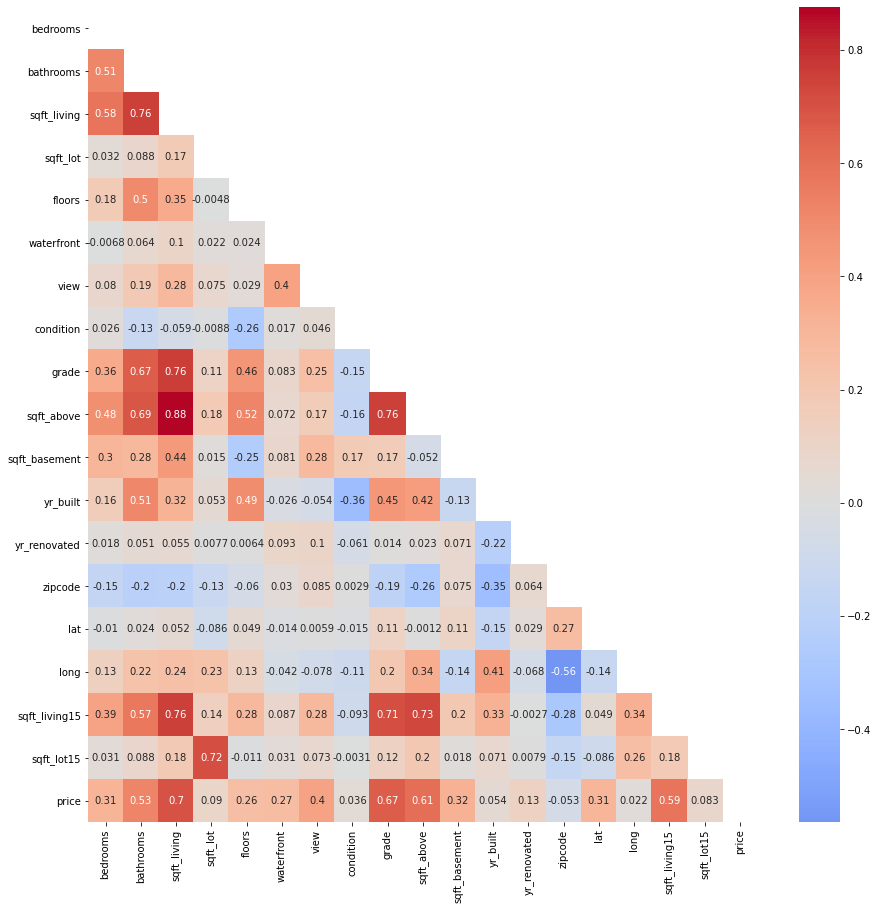

In [118]:
fig, ax = plt.subplots(figsize=(15, 15))

mask=np.zeros_like(df.corr()) # define fields we don't want to see
mask[np.triu_indices_from(mask)]=True

sns.heatmap(df.corr(),  # the data for the heatmap, our dataframe
            mask=mask,  # "deactivates" all fields in our heatmap according to the mask
            annot=True,  # show the actual values of correlation in the map
            cmap='coolwarm',  # provide the 'coolwarm' colormap for the heatmap
            center=0,  # specify the value at which to center the colormap, we set it to zero, so negative correlations are displayed as negatives
           )
plt.show()

### First assumptions from the heatmap:

- All sqft fields are highly correlated to the price. I would suggest to only choose one of the different sqft fields per model. This makes sense, since size is usually the largest driver of real estate prices.
- Zicode makes probably more sense to use than lat and long, longitude and zipcode are highly negative correlated.
- sqft_living and sqft_above appear to mean almost the same since they're highly correlated as well
- Zipcode and year build are strangely negatively correlated, meaning we have areas that deveoped over time? 
- The year build and the condition are negatively correlated, that makes sense, since newer buildings are usualy in a better condition

***


### Now we look at all scatterplots as pairs:
***

In [119]:
#sns.pairplot(df);

### A scatterplot of price vs bedrooms:
***

In [40]:
fig = px.scatter(df, x="price", y="bedrooms", color_discrete_sequence=px.colors.qualitative.Alphabet) #note that I am using plotly library
fig.show()


### A scatterplot of price vs living space
***

In [30]:
fig = px.scatter(df, x="price", y="sqft_living", color_discrete_sequence=px.colors.qualitative.Dark2)
fig.show()

### A scatterplot of grade vs price
***

In [34]:
fig = px.scatter(df, x="grade", y="price", color_discrete_sequence=px.colors.qualitative.G10)
fig.show()

### A 3D scatterplot of grade vs condition and price
***

In [42]:

fig = px.scatter_3d(df, x="condition", y="grade", z="price", 
                    color="condition",size='grade')
fig.show()

### A scatterplot of condition vs grade
***

In [35]:
fig = px.scatter(df, x="condition", y="grade", color_discrete_sequence=px.colors.qualitative.Antique)
fig.show()

### A scatterplot of condition vs price
***

In [41]:
fig = px.scatter(df, x="condition", y="price", color_discrete_sequence=px.colors.qualitative.D3)
fig.show()

### A scatterplot of year renovated vs price
***

In [37]:
fig = px.scatter(df, x="yr_renovated", y="price", color_discrete_sequence=px.colors.qualitative.Bold)
fig.show();

### The following scatterplot shows the relationship of price, bedrooms and wether theres a waterfront or not
***

In [31]:
fig = px.scatter(df, x="price", y="bedrooms", color="waterfront",
                     size='price', hover_data=['bedrooms'])
fig.show()

Waterfronts appear to have a random influence on price. I reccomend dropping the column since it's mostly zeroes

### The following scatterplot shows the relationship of price, condition and the grade of the estate
***

In [38]:
fig = px.scatter(df, x="price", y="condition", color="grade",
                     size='price', hover_data=['grade'])
fig.show()

### These plots show the distribution of price, grade, living space and condition in our dataset
***

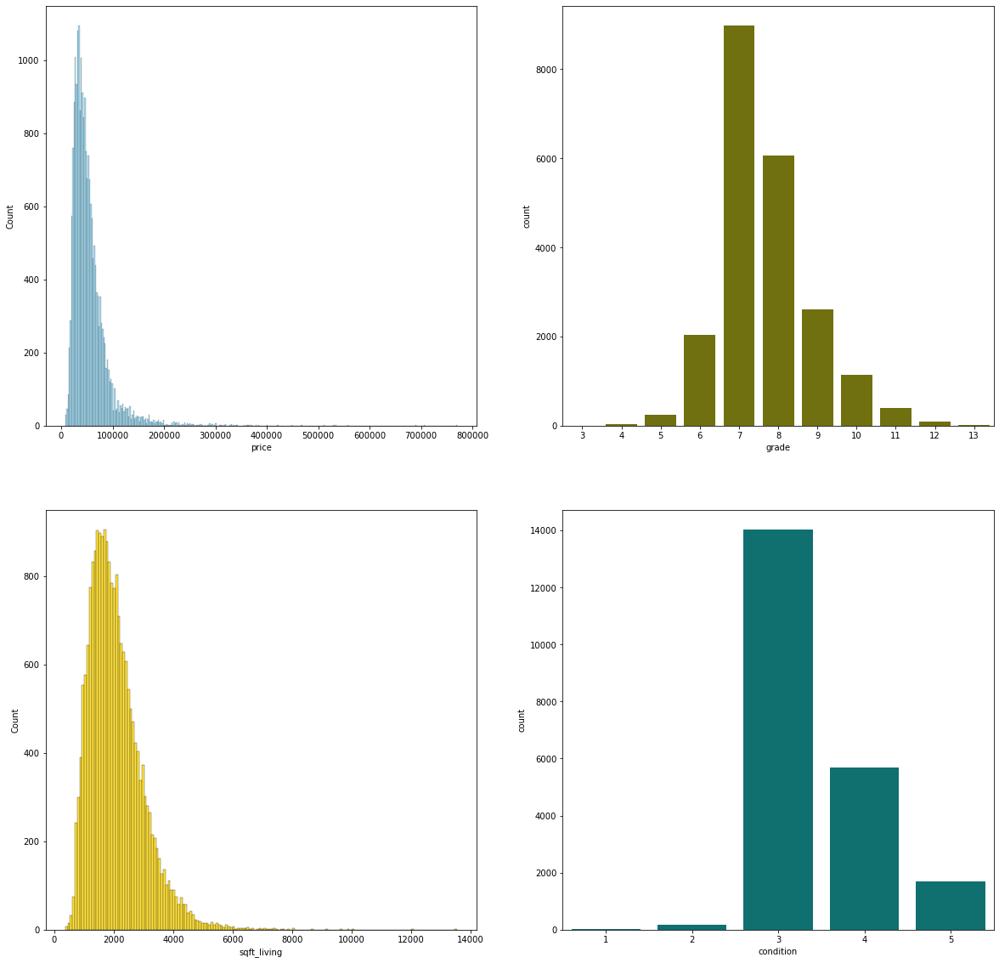

In [129]:
f, axes = plt.subplots(2, 2, figsize=(20, 20), sharex=False);
sns.histplot(x=df["price"] , color="skyblue", ax=axes[0, 0]);
sns.countplot(x=df["grade"] , color="olive", ax=axes[0, 1]);
sns.histplot(x=df["sqft_living"], color="gold", ax=axes[1, 0]);
sns.countplot(x=df["condition"] , color="teal", ax=axes[1, 1]);


### Closer examine the distribution of price
***

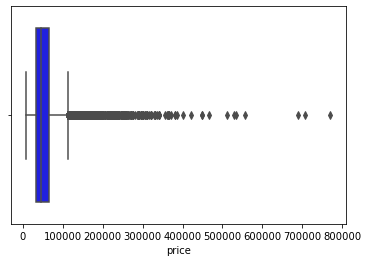

In [130]:
sns.boxplot(x=df["price"], color='blue');


### These plots show the distribution of bathrooms, floors, zipcode, and view in our dataset
***

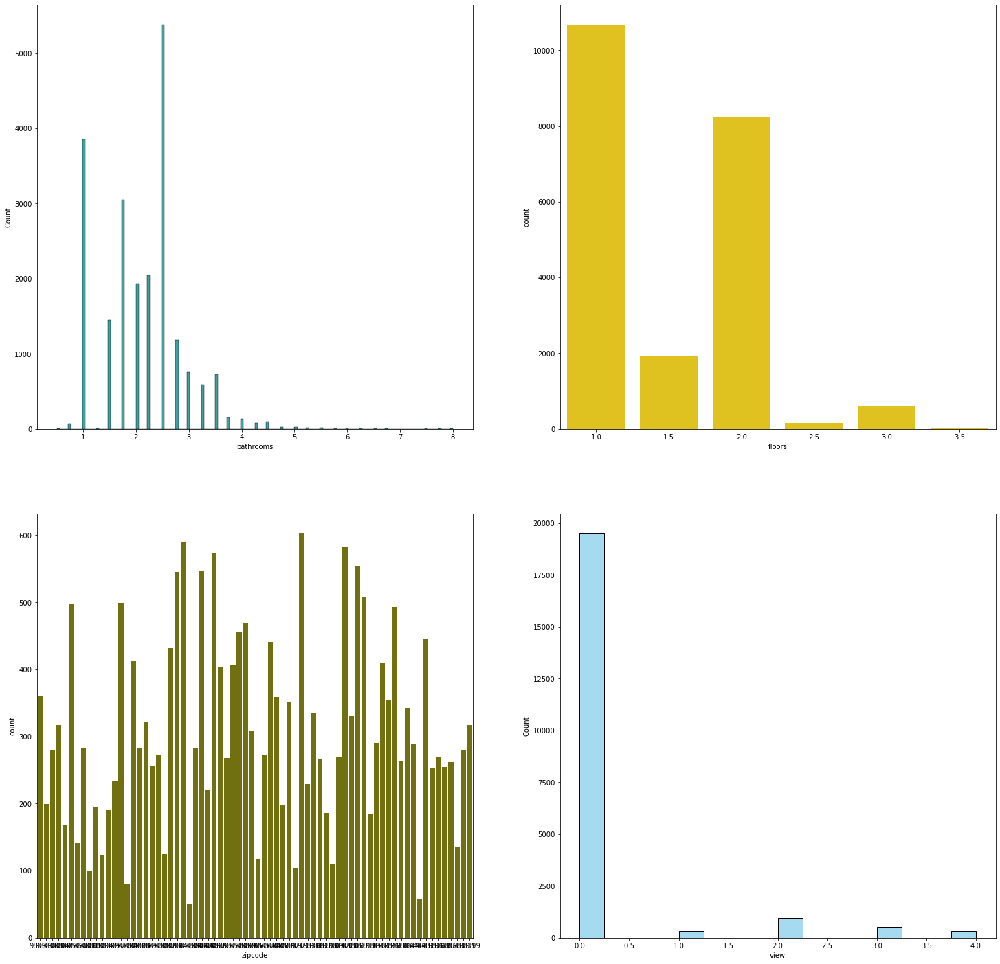

In [131]:
f, axes = plt.subplots(2, 2, figsize=(25, 25), sharex=False);
sns.histplot(x=df["bathrooms"] , color="teal", ax=axes[0, 0]);
sns.countplot(x=df["floors"] , color="gold", ax=axes[0, 1]);
sns.countplot(x=df["zipcode"], color="olive", ax=axes[1, 0]);
sns.histplot(x=df["view"] , color="skyblue", ax=axes[1, 1]);

### These plots show the distribution of bedrooms, sqft_above, yr_built, and yr_renovated in our dataset
***

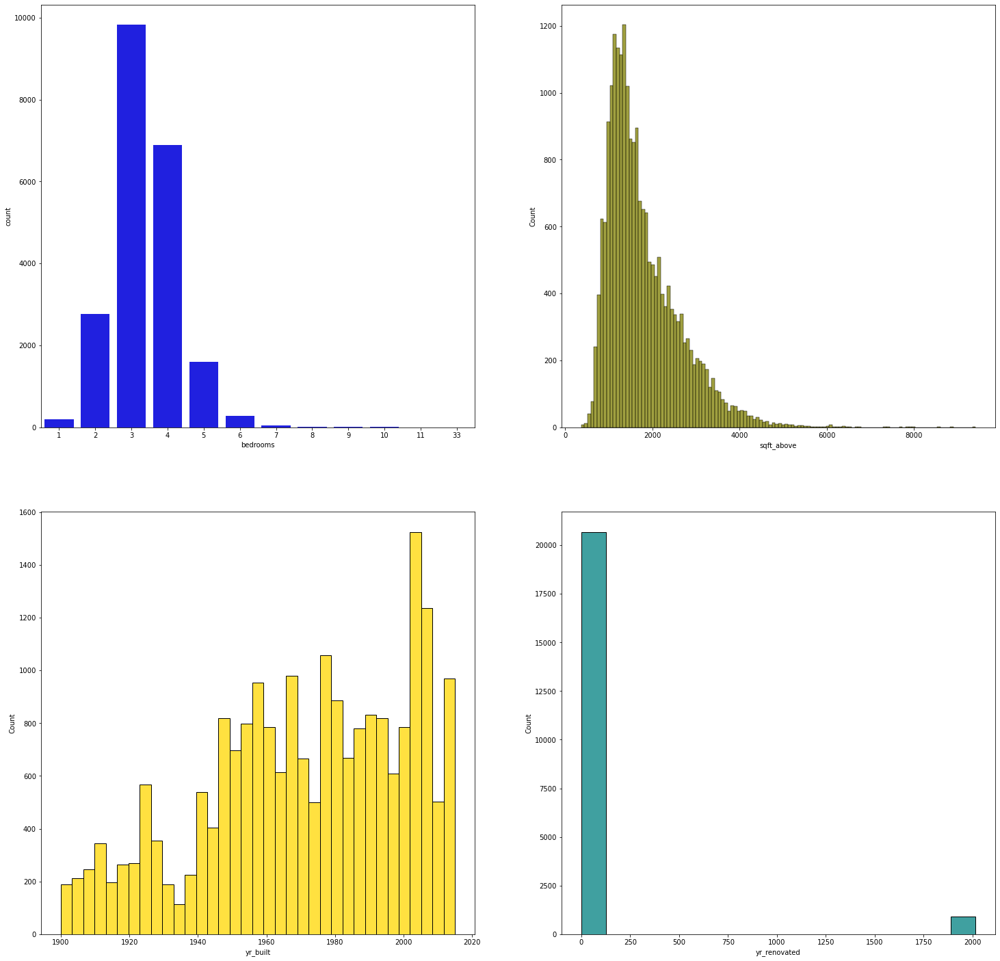

In [132]:
f, axes = plt.subplots(2, 2, figsize=(25, 25), sharex=False);
sns.countplot(x=df["bedrooms"] , color="blue", ax=axes[0, 0]);
sns.histplot(x=df["sqft_above"] , color="olive", ax=axes[0, 1]);
sns.histplot(x=df["yr_built"], color="gold", ax=axes[1, 0]);
sns.histplot(x=df["yr_renovated"] , color="teal", ax=axes[1, 1]);

### Boxplots for price, grade, living space and condition
***

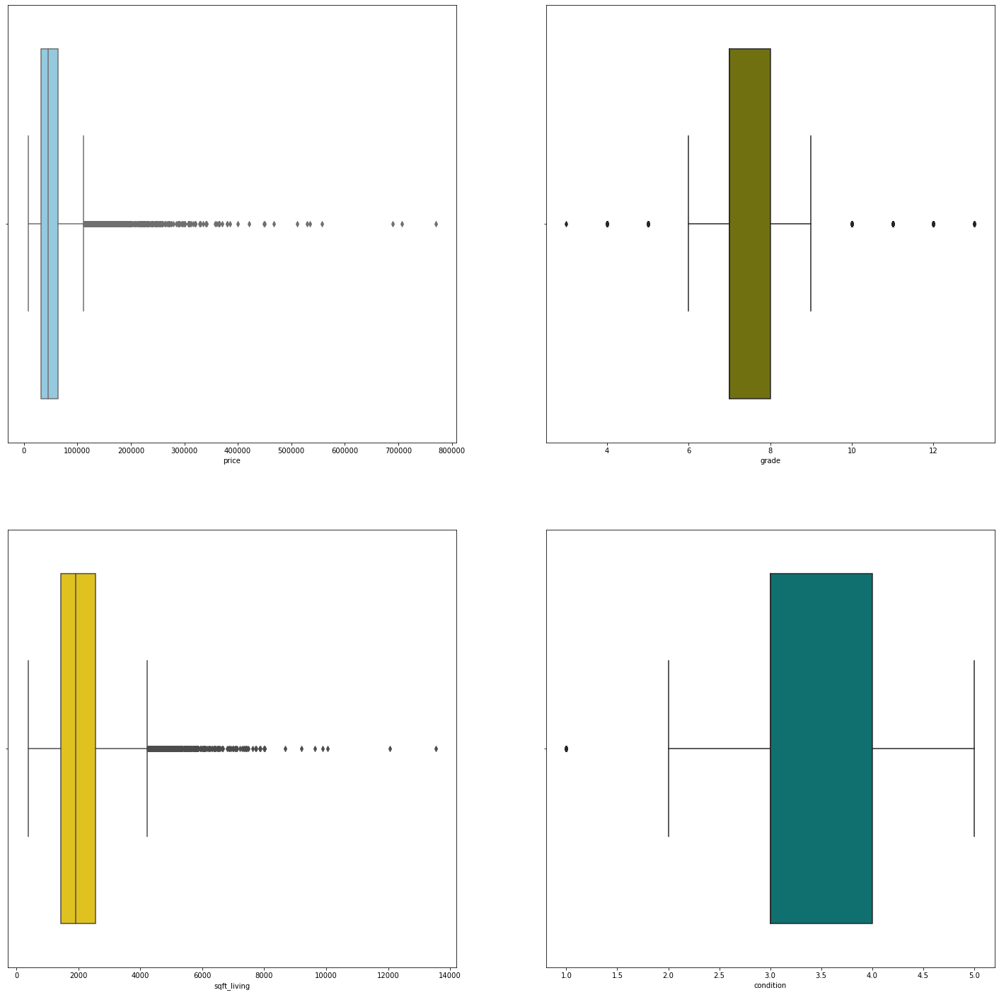

In [133]:
f, axes = plt.subplots(2, 2, figsize=(25, 25), sharex=False);
sns.boxplot(x=df["price"] , color="skyblue", ax=axes[0, 0]);
sns.boxplot(x=df["grade"] , color="olive", ax=axes[0, 1]);
sns.boxplot(x=df["sqft_living"], color="gold", ax=axes[1, 0]);
sns.boxplot(x=df["condition"] , color="teal", ax=axes[1, 1]);

### Boxplots for bathrooms, floors, zipcode and view
***

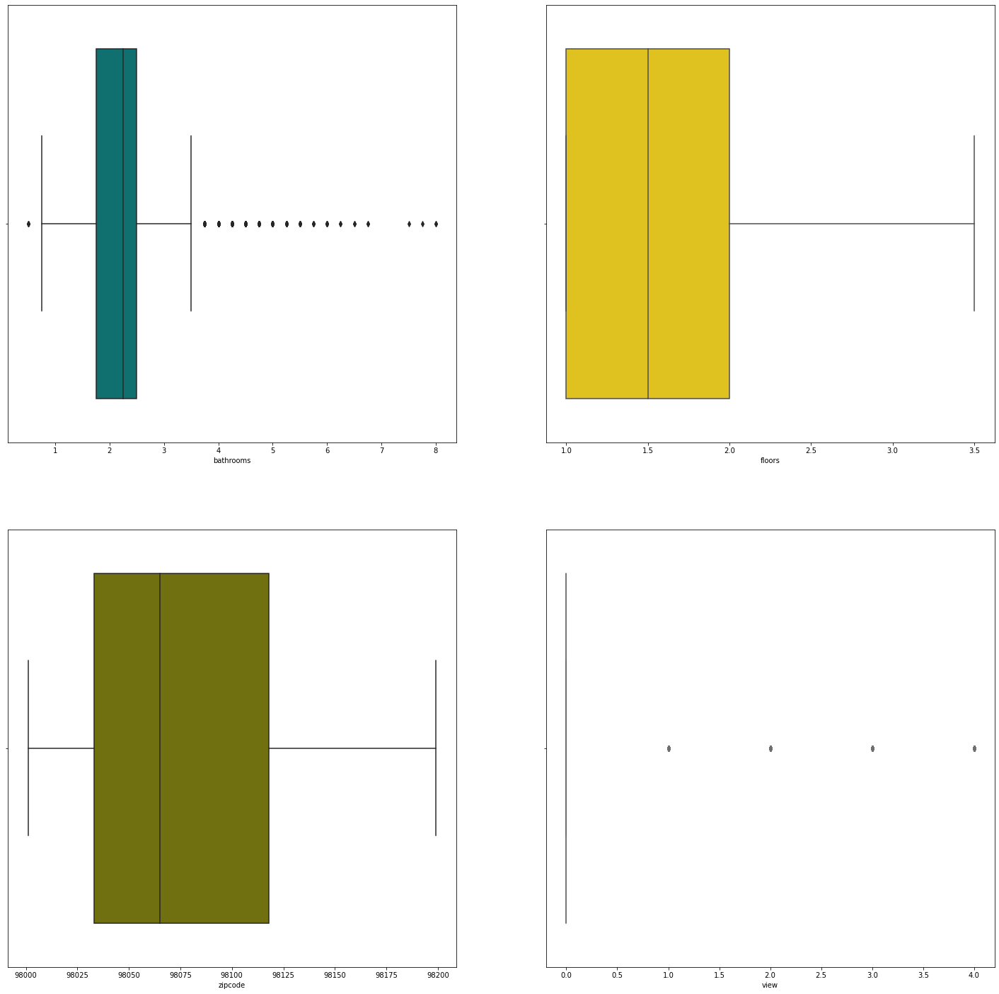

In [134]:
f, axes = plt.subplots(2, 2, figsize=(25, 25), sharex=False);
sns.boxplot(x=df["bathrooms"] , color="teal", ax=axes[0, 0]);
sns.boxplot(x=df["floors"] , color="gold", ax=axes[0, 1]);
sns.boxplot(x=df["zipcode"], color="olive", ax=axes[1, 0]);
sns.boxplot(x=df["view"] , color="skyblue", ax=axes[1, 1]);


### Boxplots for bedrooms, sqft_above, yr_built, and yr_renovated 
***

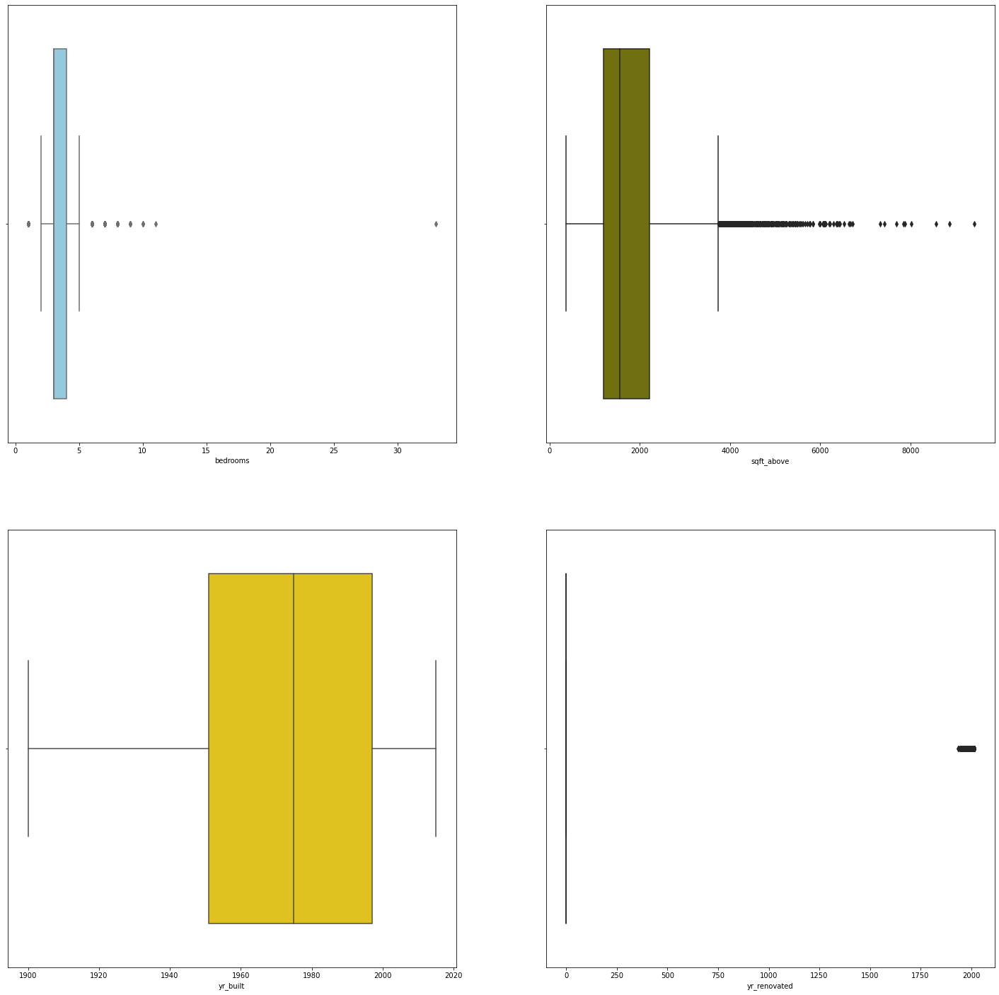

In [135]:
f, axes = plt.subplots(2, 2, figsize=(25, 25), sharex=False);
sns.boxplot(x=df["bedrooms"] , color="skyblue", ax=axes[0, 0]);
sns.boxplot(x=df["sqft_above"] , color="olive", ax=axes[0, 1]);
sns.boxplot(x=df["yr_built"], color="gold", ax=axes[1, 0]);
sns.boxplot(x=df["yr_renovated"] , color="teal", ax=axes[1, 1]);

In [136]:
# esport dataframe to new csv we can later use for wrangling and cleaning
df.to_csv('firstout.csv')


***